## Исследование рынка заведений общественного питания Москвы

**Цель исследования:** подготовить рекомендации по открытию кофейни в г. Москва

**Задачи исследования:**
- выявить особенности и закономерности
- дать рекомендации по открытию кофейни
- подготовить презентацию по полученным результатам

Входные данные: датасет 'moscow_places.csv' с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках.


**План работы:**

1. [Открытие данных](#start)
    
2. [Предобработка данных](#preprocessing)
    * [Проверка на пропуски](#null)
    * [Проверка на дубликаты](#duplicates)
    * [Создание столбцов](#insert_columns)
    * [Выводы по разделу](#conclusion_processing)
        
3. [Анализ данных](#analysis)
    * [Количество заведений по категориям](#count_by_category)
    * [Количество посадочных мест по категориям](#count_seats_by_category)
    * [Соотношение сетевых и несетевых заведений](#is_chain)
    * [Категории сетевых заведений](#is_chain_category)
    * [Топ-15 популярных сетей в г. Москва](#top_15_chains)
    * [Количество заведений по районам и категориям](#count_by_district)
    * [Средние рейтинги по категориям заведений](#rating_by_category)
    * [Средние рейтинги по районам](#rating_by_district)
    * [Карта заведений в кластерах](#map_with_clusters)
    * [Топ-15 улиц по количеству заведений](#top_15_street)
    * [Улицы с наименьшим количеством заведений](#min_cafe_street)
    * [Медианный средний чек по районам](#median_bill_by_district)
    * [Заведения с низким рейтингом](#low_raiting)
    * [Выводы по разделу](#conclusion_analysis)
        
4. [Анализ кофеен г. Москва](#coffe_house_analyses)
    * [Распределение кофеен районам, их рейтинг и медианная цена за чашку капучино](#coffe_house_indicators)
    * [Топ-15 сетевых кофеен в г. Москва](#coffe_house_chains)
    * [Круглосуточные кофейни](#coffe_house_is_24_7)
    * [Выводы по разделу](#conclusions_coffee_houses)
        
5. [Рекомендации по открытию кафе](#recommendations_about_opening_coffee_house)
    * [Расположение](#recommendations_about_place)
    * [Ценовая политика](#recommendations_about_price)
6. [Выводы и результаты исследования](#common_conclusion)

### Шаг 1. Открытие данных
<a id="start"></a> 

In [1]:
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import re 
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium import Marker

In [2]:
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('./moscow_places.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


***Выводы по разделу***

- Набор данных содержит 8406 строк, 14 столбцов.
- Типы данных: int64 - целые числа, float64 - вещественные числа, object  - строки и прочее.
- В 6 столбцах имеются пропуски.

В датасете представлено 8406 заведений г. Москва. Каждое заведение имеет название, категорию, адрес, административный округ, географические координаты, рейтинг. Данные о ценовой категории и ценовой политике заведения имеются менее, чем у половины заведений из набора данных.

### Шаг 2. Предобработка данных
<a id="preprocessing"></a> 

#### Проверка на пропуски
<a id="null"></a> 

Посмотрим на столбцы, где имеются пропуски:

In [4]:
pd.DataFrame(round(df.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Доля пропусков более 50% встречается в столбцах с ценовой категорией, средним чеком, средним счетом, ценой одной чашки капучино. Это важные для исследования данные, но достоверно восполнить их отсутствие не представляется возможным, так как ценовая политика заведений общепита может отличаться даже в рамках одной сети. Оставим эти пропуски без изменений.

В столбце с часами работы пропуски составляют 6% (не критичный показатель для исследования), в столбце с количеством посадочных мест - 43% (показатель большой,  но для исследования так же не критичный). Оставим эти пропуски без изменений.

In [5]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


#### Проверка на дубликаты
<a id="duplicates"></a> 

Явных дубликатов не обнаружено:

In [6]:
df.duplicated().sum()

0

Проверим дубликаты по совпадению наименования заведения, адреса и рейтинга:

In [7]:
df['name'] = df['name'].apply(lambda x: x.lower())

In [8]:
df[df.duplicated(subset=['name', 'address', 'rating'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Удалим строки с дубликатами:

In [9]:
df = df.drop_duplicates(subset = ['name', 'address', 'rating'])

Датасет уменьшился на 3 строки:

In [10]:
df.shape

(8403, 14)

Названия заведений могут повторяться, так как в датасете присутствуют сетевые заведения, а также в данном столбце вполне возможны и совпадения названий. Это подтверждает тот факт, что среди 8406 заведений только 5614 уникальных имен:

In [11]:
len(df['name'].unique())

5512

В названиях АО неявных дубликатов не обнаружено:

In [12]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Ценовые категории представлены 4 типами:

In [13]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Значение рейтинга варьируется в диапазоне от 1 до 5, аномалий не обнаружено:

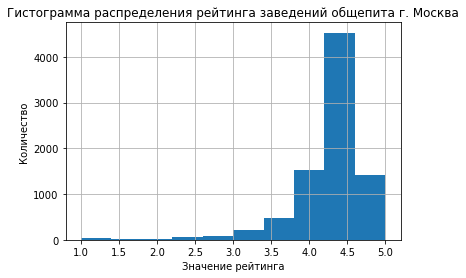

In [14]:
df['rating'].hist()
plt.xlabel('Значение рейтинга')
plt.ylabel('Количество')
plt.title('Гистограмма распределения рейтинга заведений общепита г. Москва')
plt.show()

#### Создание столбцов
<a id="insert_columns"></a> 

Так как запись улицы в строке адреса не унифицирована и встречается в разнообразных выражениях: линия, проспект, проезд и т.д., были проверены возможные варианты вхождений методом .str.contains():

In [15]:
df.query('address.str.contains("линия")').head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1037,фудкорт рестомаркет,кафе,"Москва, Калужско-Рижская линия, метро ВДНХ",Северо-Восточный административный округ,"ежедневно, 11:00–23:00",55.831891,37.630745,4.2,NaN,NaN,NaN,NaN,0,NaN
1081,фуд-холл рестомаркет,ресторан,"Москва, Калужско-Рижская линия, метро ВДНХ",Северо-Восточный административный округ,"ежедневно, 11:00–23:00",55.836031,37.624333,4.2,NaN,NaN,NaN,NaN,0,NaN
1245,песок,кафе,"Москва, 4-я линия Хорошёвского Серебряного Бор...",Северо-Западный административный округ,"ежедневно, 09:00–21:00",55.777716,37.406724,4.3,NaN,Средний счёт:2900 ₽,2900.0,NaN,0,NaN
1247,шатер адмирал,кафе,"Москва, 4-я линия Хорошёвского Серебряного Бор...",Северо-Западный административный округ,"ежедневно, 09:00–21:00",55.780050,37.405438,4.1,NaN,NaN,NaN,NaN,0,NaN
1250,blink seafood,ресторан,"Москва, 4-я линия Хорошёвского Серебряного Бор...",Северо-Западный административный округ,вт-вс 12:00–00:00,55.781127,37.405287,3.3,NaN,NaN,NaN,NaN,0,NaN


Создадим функцию, которая по регулярному выражению проверит нужные нам вхождения в строке адреса и вернет только искомые варианты:

In [16]:
def extract_street(data):
    regexp = '.*, (.*(?:проезд|улица|проспект|район|переулок|бульвар|аллея|шоссе|площадь|проезд|набережная|тупик|линия).*?),'
    street = re.search(regexp, data)
   
    if not street:
        return None
    return street.group(1)
    

df['street']  =  df['address'].apply(extract_street)

In [17]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [18]:
df['address'].str.split(', ').str[1].head()

0              улица Дыбенко
1              улица Дыбенко
2         Клязьминская улица
3    улица Маршала Федоренко
4        Правобережная улица
Name: address, dtype: object

В некоторых адресах (около 2,5%) местоположение заведений указано неявным способом, поэтому выявить аналог улицы в таких данных не удалось:

In [19]:
df['street'].isna().sum() / df.shape[0]

0.024634059264548376

Создадим столбец с обозначением, является ли заведение круглосуточным:

In [20]:
df['is_24/7'] = False

In [21]:
df.loc[df['hours'] == "ежедневно, круглосуточно", 'is_24/7'] = True

Круглосуточных заведений оказалось 730:

In [22]:
df['hours'].str.contains('ежедневно, круглосуточно')

0       False
1       False
2       False
3       False
4       False
        ...  
8401    False
8402    False
8403     True
8404     True
8405     True
Name: hours, Length: 8403, dtype: object

In [23]:
df['is_24/7'].sum()

730

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4792 non-null   float64
 14  street             8196 non-null   object 
 15  is_24/7            8403 non-null   bool   
dtypes: bool(1), float64(6), 

#### Выводы по разделу:
<a id="conclusion_processing"></a> 

- пропуски оставлены без изменений
- удалены дубликаты заведений по совпадению наименования, адреса и рейтинга
- добавлен новый столбец с улицей заведения (или ее аналогом) на базе его адреса 
- добавлен новый столбец с обозначением, является ли заведение круглосуточным

Обновленный размер датасета: 8403 строки, 16 столбцов. Типы данных: int64 - целые числа, float64 - вещественные числа, object  - строки и прочее, bool - булевы значения.

### Шаг 3. Анализ данных
<a id="analysis"></a> 

#### Количество заведений по категориям
<a id="count_by_category"></a> 

Посмотрим, какие категории заведений представлены в датасете:

In [25]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [26]:
count_by_category = df.groupby('category', as_index = False)\
                      .agg({'name' : 'count'})\
                      .rename(columns = {'name' : 'count'})\
                      .sort_values('count', ascending = False)

In [27]:
count_by_category

,category,count
3,кафе,2377
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",764
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


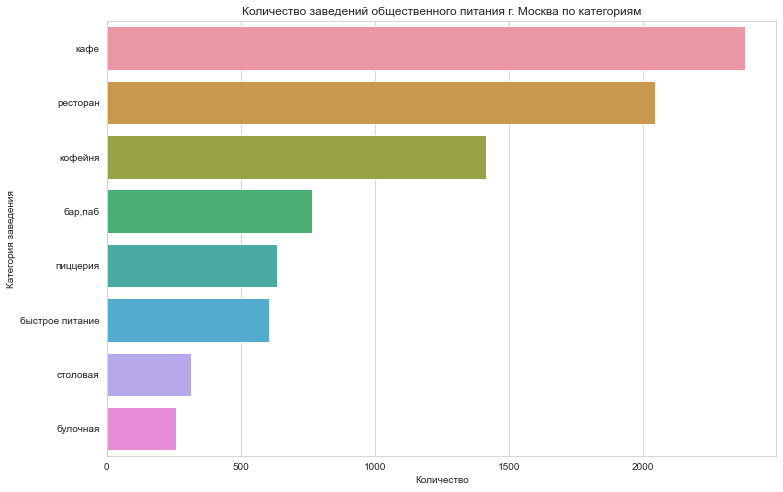

In [28]:
sns.set_style('whitegrid')
sns.set_palette('gist_rainbow') 
plt.figure(figsize=(12, 8))
sns.barplot(data = count_by_category, x = 'count', y = 'category')
plt.xlabel('Количество')
plt.ylabel('Категория заведения')
plt.title('Количество заведений общественного питания г. Москва по категориям')
plt.show()

На представленном графике видно, что в топ-3 категории входят: кафе (2378 заведений), рестораны (2043 заведения), кофейни (1413 заведений). В прочих категориях количество заведений составляет менее 1000. 

##### Количество посадочных мест по категориям
<a id="count_seats_by_category"></a> 

In [29]:
count_seats_by_category = df.query('seats.notnull()')\
                            .groupby('category', as_index = False)\
                            .agg({'seats' : 'median'})\
                            .rename(columns = {'seats' : 'seats_median'})\
                            .sort_values('seats_median', ascending = False)
count_seats_by_category

,category,seats_median
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


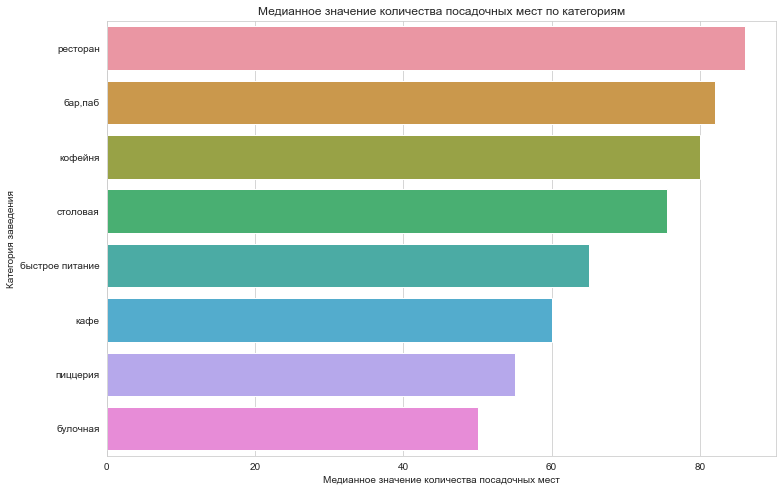

In [30]:
plt.figure(figsize=(12, 8))
sns.barplot(data = count_seats_by_category, x = 'seats_median', y = 'category')
plt.xlabel('Медианное значение количества посадочных мест')
plt.ylabel('Категория заведения')
plt.title('Медианное значение количества посадочных мест по категориям')
plt.show()

Топ-3 категории по количеству посадочных мест в заведении (80 и более): рестораны, бары/пабы, кофейни. 
В столовых, заведениях быстрого питания и кафе в среднем 60 - 75 мест. Меньше всего посадочных мест в пиццериях и булочных: 50- 55 мест.

#### Соотношение сетевых и несетевых заведений
<a id="is_chain"></a> 

In [31]:
df.query('chain == 1')['chain'].count()

3203

In [32]:
df.query('chain == 0')['chain'].count()

5200

In [33]:
df.shape

(8403, 16)

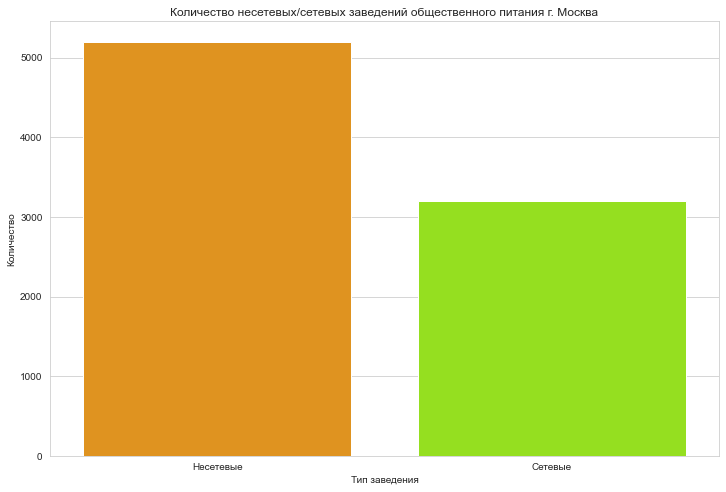

In [34]:
plt.figure(figsize=(12, 8))
sns.countplot(x=df['chain'])
plt.xticks([0, 1], ['Несетевые', 'Сетевые'])
plt.xlabel('Тип заведения')
plt.ylabel('Количество')
plt.title('Количество несетевых/сетевых заведений общественного питания г. Москва')
plt.show()

В представленных данных несетевых заведений в 1,6 раза больше, чем сетевых.

#### Категории сетевых заведений
<a id="is_chain_category"></a> 

In [35]:
df_chain = df.query('chain == 1')

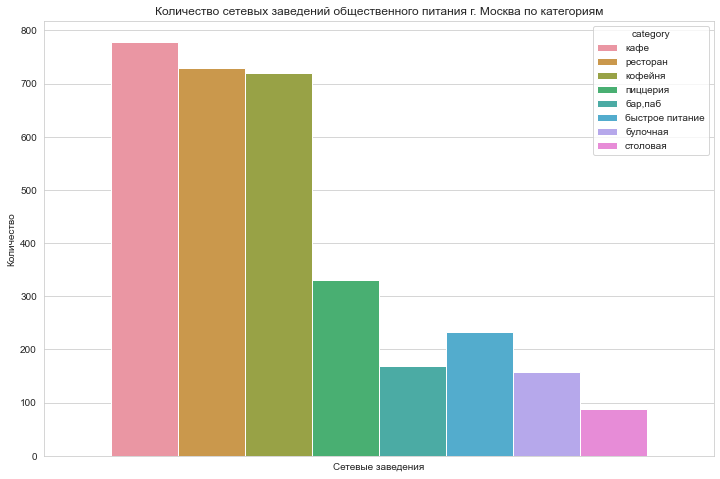

In [36]:
plt.figure(figsize=(12, 8))
sns.countplot(x=df_chain['chain'], hue = df['category'])
plt.xticks([0], ['Сетевые заведения'])
plt.xlabel('')
plt.ylabel('Количество')
plt.title('Количество сетевых заведений общественного питания г. Москва по категориям')
plt.show()

Чаще всего сетевые заведения представлены в виде кафе, ресторанов и кофеен.

#### Топ-15 популярных сетей в г. Москва
<a id="top_15_chains"></a> 

In [37]:
top_15_chains =   df.query('chain == 1')\
                    .groupby('name', as_index = False)\
                    .agg({'chain' : 'count'})\
                    .rename(columns = {'chain' : 'count'})\
                    .sort_values('count', ascending = False)\
                    .head(15)\
                    .reset_index(drop = True)
top_15_chains

,name,count
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


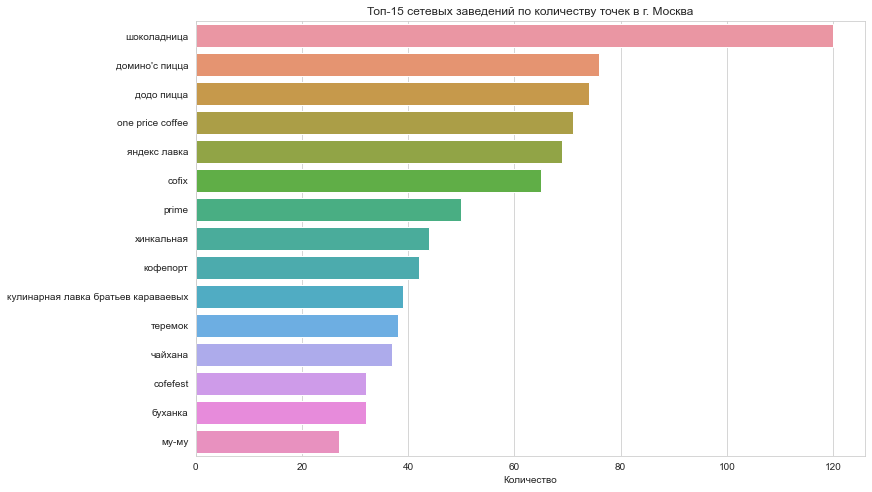

In [38]:
plt.figure(figsize=(12, 8))
sns.barplot(data = top_15_chains, x = 'count', y = 'name')
plt.xlabel('Количество')
plt.ylabel('')
plt.title('Топ-15 сетевых заведений по количеству точек в г. Москва')
plt.show()

Многие названия сетевых заведений действительно "на слуху", что подтверждает их распространенность. Большинство из них представлены не только в Москве, но и других городах России. Посмотрим, какие категории заведений встречаются чаще всего:

In [39]:
top_names = top_15_chains['name'].unique()

top_chains_by_category = df.query('chain == 1')\
                        .query('name in @top_names')\
                        .groupby(['name', 'category'])\
                        .agg({'chain' : 'count'})\
                        .rename(columns = {'chain' : 'count'})\
                        .sort_values(['name', 'count'], ascending = False)
top_chains_by_category.head()

count
name         category       
яндекс лавка ресторан     69
шоколадница  кофейня     119
             кафе          1
чайхана      кафе         26
             ресторан      9

Самыми распространенными форматами в топ-15 сетей являются кафе, кофейни, рестораны и пиццерии.

#### Количество заведений по районам и категориям
<a id="count_by_district"></a> 

Всего в датасете представлено 9 административных округов Москвы:

In [40]:
df.district.unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

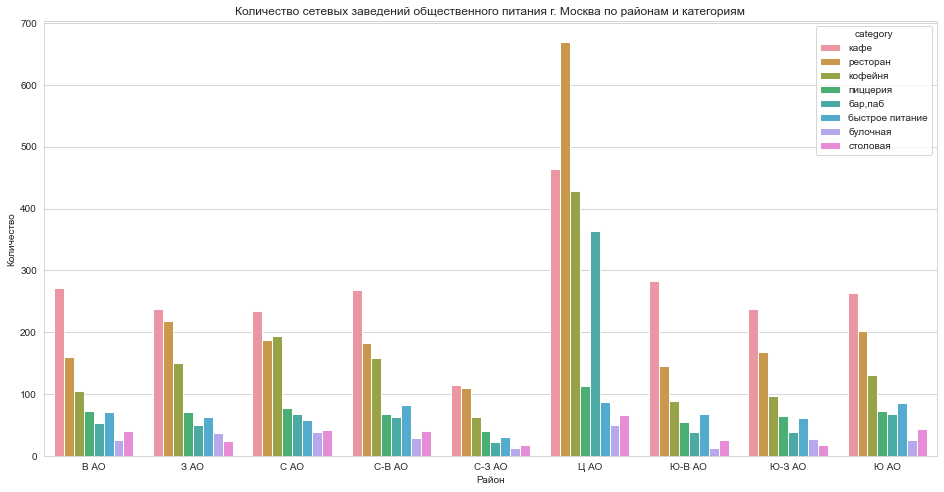

In [41]:
sns.set_palette('gist_rainbow')
plt.figure(figsize=(16, 8))
sns.countplot(x=df.sort_values('district')['district'], hue = df['category'])
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8], ['В АО', 'З АО', 'С АО', 'С-В АО', 'С-З АО', 'Ц АО', 'Ю-В АО', 'Ю-З АО', 'Ю АО'])
plt.xlabel('Район')
plt.ylabel('Количество')
plt.title('Количество сетевых заведений общественного питания г. Москва по районам и категориям')
plt.show()

Для более наглядного отображения количества заведений по районам и категориям построим этот же график средствами библиотеки plotly:

In [42]:
district_df = df.groupby(['district', 'category'], as_index = False)\
                .agg({'name' : 'count'})\
                .rename(columns = {'district':'Район', 'category':'Категория', 'name' : 'Количество'})
district_df.head()

,Район,Категория,Количество
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105


In [43]:
fig = px.bar(data_frame=district_df, x='Район', y='Количество', 
             color='Категория',
             title = 'Количество  заведений общественного питания г. Москва по районам и категориям')

for idx in range(len(fig.data)):
    fig.data[idx].x = ['В АО', 'З АО', 'С АО', 'С-В АО', 'С-З АО', 'Ц АО', 'Ю-В АО', 'Ю-З АО', 'Ю АО']
fig.show()

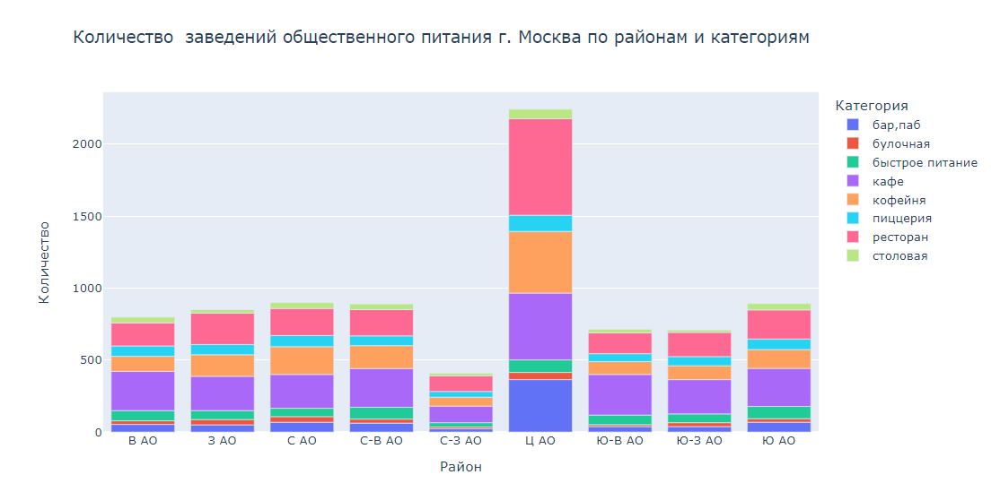

На графике видно, что больше всего заведений представлено в Центральном АО Москвы (более 2000 - в 2 раза больше, чем в любом другом АО Москвы). При этом лидируют в данном районе рестораны (в 3 раза больше заведений, чем в любом другом АО), кафе, кофейни (в 3 раза больше заведений, чем в любом другом АО) и бары/пабы (в 5 раз больше, чем в других АО). В других районах преобладают кафе, рестораны и кофейни.

#### Средние рейтинги по категориям заведений
<a id="rating_by_category"></a> 

In [44]:
rating_by_category = df.groupby('category', as_index = False)\
                        .agg({'rating' : 'median'})\
                        .sort_values('rating', ascending = False)
rating_by_category

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


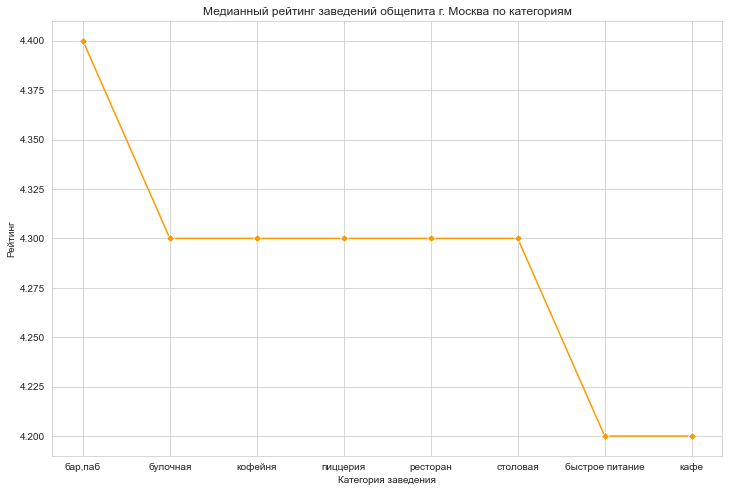

In [45]:
plt.figure(figsize=(12, 8))
sns.lineplot(data = rating_by_category, x = 'category', y = 'rating',  marker='D')
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг')
plt.title('Медианный рейтинг заведений общепита г. Москва по категориям')
plt.show()

Стоит отметить, что медианный рейтинг заведений по категориям варьируется в малом диапазоне 4.2 - 4.4, это говорит, что различия рейтинга по категориям заведений не значительны. С небольшим преимуществом в рейтинге лидируют бары и пабы, небольшое отставание в рейтинге у заведений быстрого питания и кафе.

#### Средние рейтинги по районам
<a id="rating_by_district"></a> 

In [46]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


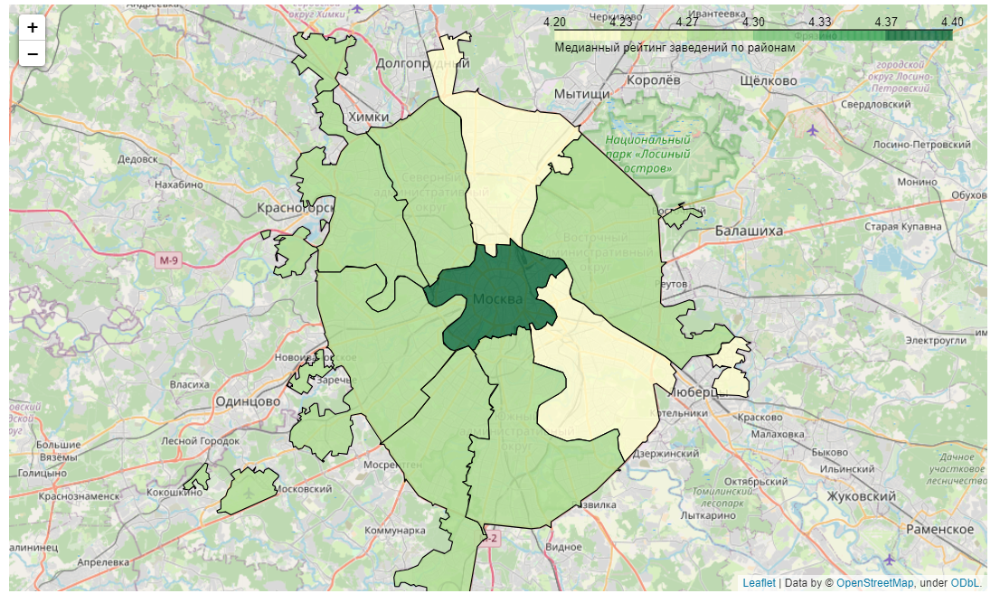

Медианные рейтинги по районам не сильно отличаются друг от друга. В Центральном АО медианный рейтинг немного выше (4.4), чем в остальных районах. Немногим ниже рейтинги в Северо-Восточном и Юго-Восточном АО (4.2).

#### Карта заведений в кластерах
<a id="map_with_clusters"></a> 

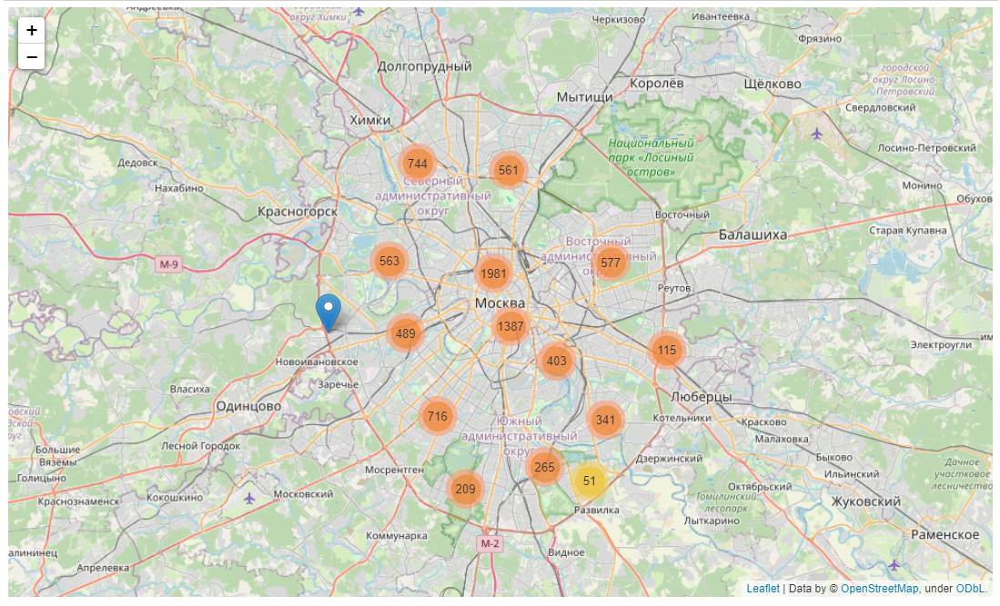

#### Топ-15 улиц по количеству заведений
<a id="top_15_street"></a> 

In [50]:
top_15_street = df.groupby('street', as_index = False)\
                    .agg({'name': 'count'})\
                    .rename(columns = {'name' : 'count'})\
                    .sort_values('count', ascending = False)\
                    .head(15)
top_15_street

,street,count
1022,проспект Мира,183
746,Профсоюзная улица,122
1019,проспект Вернадского,108
503,Ленинский проспект,107
501,Ленинградский проспект,95
355,Дмитровское шоссе,88
436,Каширское шоссе,77
286,Варшавское шоссе,75
502,Ленинградское шоссе,69
522,Люблинская улица,60


In [51]:
top_15_street_names = top_15_street['street'].unique()
top_15_street_names

array(['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского',
       'Ленинский проспект', 'Ленинградский проспект',
       'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе',
       'Ленинградское шоссе', 'Люблинская улица', 'улица Вавилова',
       'Кутузовский проспект', 'улица Миклухо-Маклая', 'Пятницкая улица',
       'Алтуфьевское шоссе'], dtype=object)

In [52]:
top_streets_by_category = df.query('street in @top_15_street_names')\
                            .groupby(['street', 'category'], as_index = False)\
                            .agg({'name' : 'count'})\
                            .rename(columns = {'name' : 'count'})\
                            .sort_values(['street', 'count'], ascending = False)
top_streets_by_category.head(5)

,street,category,count
109,улица Миклухо-Маклая,кафе,21
112,улица Миклухо-Маклая,ресторан,15
108,улица Миклухо-Маклая,быстрое питание,4
110,улица Миклухо-Маклая,кофейня,4
107,улица Миклухо-Маклая,"бар,паб",3


In [53]:
fig = px.bar(data_frame=top_streets_by_category, x='count', y='street', 
             color='category',  
             title = 'Топ-15 улиц по количеству заведений общественного питания г. Москва по категориям')

fig.update_layout( xaxis_title='Количество заведений',
                   yaxis_title='')

fig.show()

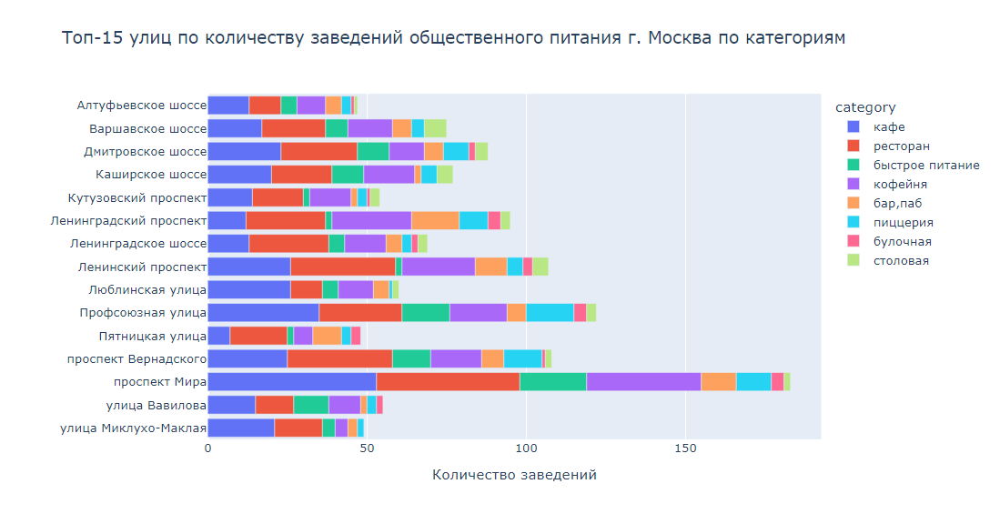

На графике видно, что самой популярной улицей по количеству заведений является проспект Мира - 183 заведения. На этой улице особенно много кафе - 53, ресторанов - 45 и кофеен - 36. Также популярными по наличию заведений являются Профсоюзная улица - 122 заведения, проспект Вернадского - 108 заведений и Ленинский проспект - 107 заведений.

#### Улицы с наименьшим количеством заведений
<a id="min_cafe_street"></a> 

In [54]:
min_cafe_street = df.groupby('street', as_index = False)\
                    .agg({'name': 'count'})\
                    .rename(columns = {'name' : 'count'})\
                    .sort_values('count', ascending = False)\
                    .query('count == 1')
min_cafe_street.head(5)

,street,count
293,Верхнелихоборская улица,1
47,1-я Фрунзенская улица,1
287,Васильевская улица,1
1201,улица Кутузова,1
1172,улица Кирпичные Выемки,1


Всего улиц, на которых находится только 1 заведение - 420.

In [55]:
min_cafe_street_names = min_cafe_street['street'].unique()

Посмотрим, в каких категориях находятся эти заведения и какой у них медианный рейтинг и чек:

In [56]:
min_cafe_street_df = df.query('street in @min_cafe_street_names')\
                        .groupby('category', as_index = False)\
                        .agg({'rating' : ['count', 'median'],
                             'middle_avg_bill' : 'median'})\

min_cafe_street_df.columns = ['category', 'count', 'median_rating', 'middle_avg_bill']
min_cafe_street_df = min_cafe_street_df.sort_values('count')
min_cafe_street_df

,category,count,median_rating,middle_avg_bill
1,булочная,9,4.40,NaN
5,пиццерия,14,4.35,600.0
2,быстрое питание,18,4.30,437.5
7,столовая,37,4.30,272.5
0,"бар,паб",40,4.45,1250.0
4,кофейня,74,4.30,462.5
6,ресторан,89,4.30,1275.0
3,кафе,139,4.20,550.0


In [57]:
fig = px.bar(data_frame=min_cafe_street_df, x='count', y='category', 
             color='middle_avg_bill',  
             text = 'median_rating',
             title = 'Категории и рейтинг заведений, являющихся единственными на своей улице')

fig.update_layout( xaxis_title='Количество заведений',
                   yaxis_title='')

fig.show()

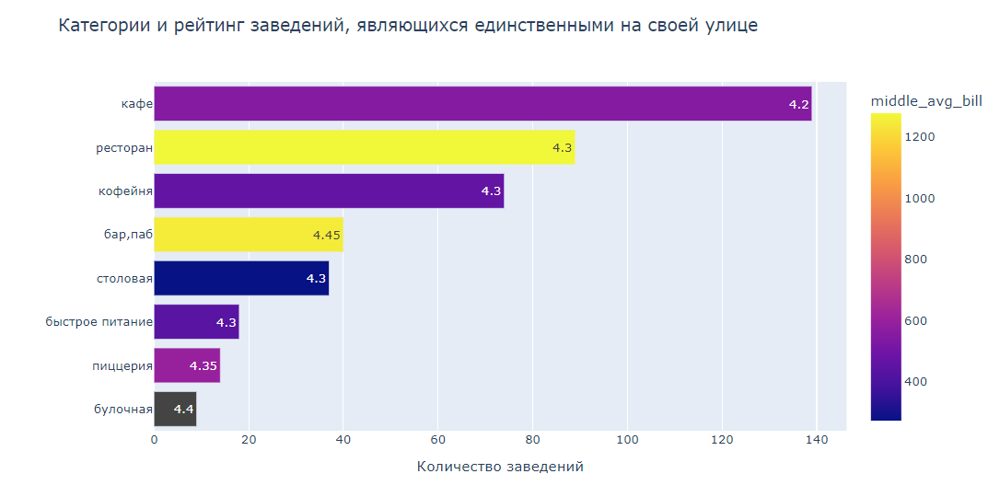

Заведения, которые представлены в единственном количестве на своих улицах, являются зачастую кафе, ресторанами или кофейнями. Средний чек в таких заведениях варьируется в диапазоне 300-1300 руб. Самый высокий средний чек в ресторанах и барах/пабах. Самый высокий рейтинг у баров/пабов, булочных.

#### Медианный средний чек по районам
<a id="median_bill_by_district"></a> 

In [58]:
median_bill_by_district = df.groupby('district', as_index = False)\
                            .agg({'middle_avg_bill' : 'median'})
median_bill_by_district

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


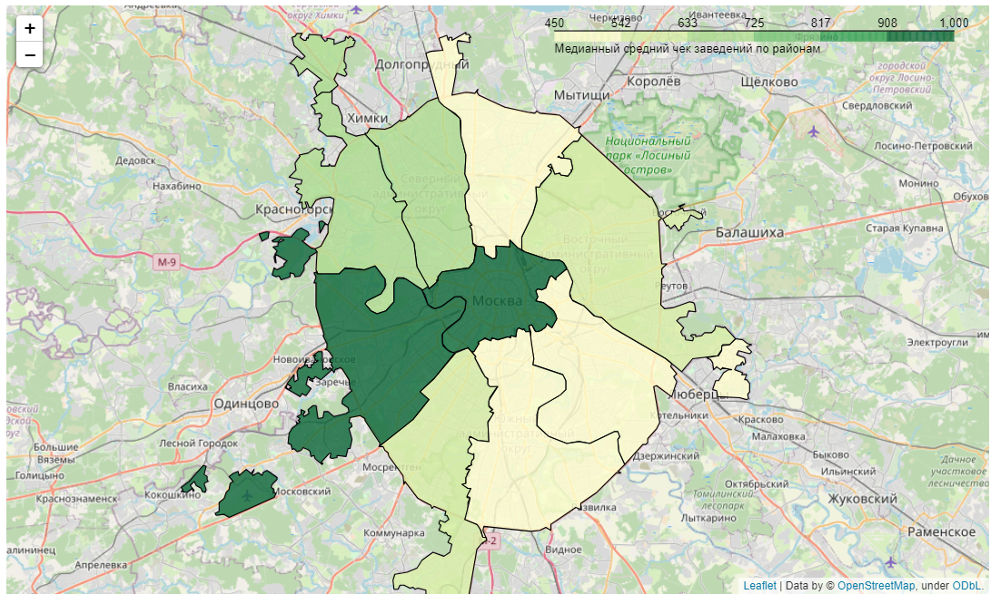

Самый высокий медианный чек в Центральном АО и Западном АО - 1000 руб. Далее идут Северо-Западный АО, Северный АО, Юго-Западный и Восточный АО с диапазоном медианного чека 575 - 700 руб. Дешевле всего медианный чек в Северо-Восточном, Южном и Юго-Восточном АО (450 - 500 руб.). Это подтверждает факт, что в центре, как правило, всегда расположены самые дорогие заведения, чем дальше от центра, тем дешевле.

#### Заведения с низким рейтингом
<a id="low_raiting"></a> 

In [60]:
df['rating'].describe()

count    8403.000000
mean        4.229894
std         0.470426
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

В качестве заведений с низким рейтингом будем рассматривать точки общественного питания с рейтингом меньше первого квартиля - 4.1.

In [61]:
df.query('rating < 4.1').shape

(1668, 16)

Таких заведений 1668 (19.85% от всех данных).

In [62]:
low_rating_by_category =  df.query('rating < 4.1')\
                            .groupby('category', as_index = False)\
                            .agg({'name' : 'count',
                                  'rating' : 'median',
                                  'middle_avg_bill' : 'median'})\
                            .rename(columns = {'name' : 'count'})\
                            .sort_values('count')
low_rating_by_category

,category,count,rating,middle_avg_bill
1,булочная,41,3.8,325.0
0,"бар,паб",60,3.8,750.0
5,пиццерия,61,3.9,500.0
7,столовая,69,3.9,300.0
4,кофейня,216,3.9,300.0
2,быстрое питание,222,3.8,325.0
6,ресторан,282,3.9,505.0
3,кафе,717,3.8,380.0


In [63]:
fig = px.bar(data_frame=low_rating_by_category, x='count', y='category', 
             color='middle_avg_bill',  
             text = 'rating',
             title = 'Распределение заведений с низким рейтингом по категориям и их медианный средний чек')

fig.update_layout( xaxis_title='Количество заведений',
                   yaxis_title='')

fig.show()

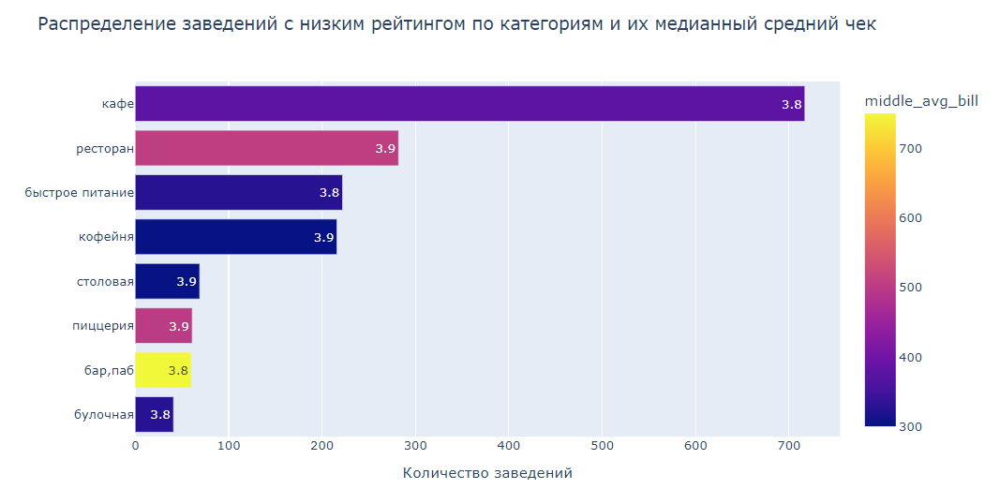

Больше всего заведений с низким рейтингом (3.8) оказалось в категории кафе - более 700, средний чек у них также невысокий - 380 руб. Около 280 ресторанов тоже отметились невысоким рейтингом (3.9), средний чек в них 505 руб., что для данной категории заведений можно считать низким показателем. Далее по количеству идут точки быстрого питания и кофейни - около 220 заведений со средним чеком 300-325. Самый высокий медианный средний чек в категории баров/пабов - 750 руб., таких заведений 60, но медианный рейтинг у них всего 3.8.

#### Выводы по разделу:
<a id="conclusion_analysis"></a> 

- Топ-3 категории заведений общественного питания г. Москва: кафе, рестораны и кофейни.
- Топ-3 категории по количеству посадочных мест в заведении (80 и более): рестораны, бары/пабы, кофейни. В столовых, заведениях быстрого питания и кафе в среднем 60 - 75 мест. Меньше всего посадочных мест в пиццериях и булочных: 50- 55 мест.
- Несетевых заведений в Москве в 1,6 раза больше, чем сетевых. 
- Чаще всего сетевые заведения представлены кафе, ресторанами и кофейнями.
- Самое популярная сеть в г. Москва - "Шоколадница" (120 заведений). Далее по популрности расположились пиццерии Домино'с пицца (76 заведений), Додо пицца (74 заведения), кофейня One price coffee	(71 заведение), Яндекс лавка (69 заведений) и кофейния Сofix (65 заведений). Самыми распространенными форматами в топ-15 сетей являются кафе, кофейни, рестораны и пиццерии.
- Больше всего заведений представлено в Центральном АО Москвы (более 2000 заведений - это в 2 раза больше, чем в любом другом АО Москвы). При этом лидируют в данном районе рестораны (в 3 раза больше заведений, чем в любом другом АО), кафе, кофейни (в 3 раза больше, чем в других АО) и бары/пабы (в 5 раз больше, чем в других АО). В остальных районах преобладают кафе, рестораны и кофейни.
- Медианный рейтинг заведений по категориям варьируется в малом диапазоне 4.2 - 4.4, это говорит, что различия рейтинга по категориям заведений не столь существенны. С небольшим преимуществом в рейтинге лидируют бары и пабы, небольшое отставание в рейтинге у заведений быстрого питания и кафе.
- Медианные рейтинги по районам/административным округам отличаются друг от друга не существенно. В Центральном АО медианный рейтинг немного выше (4.4), чем в остальных районах. Немногим ниже рейтинги в Северо-Восточном и Юго-Восточном АО (4.2).
- Самой популярной улицей по количеству заведений в г. Москва является проспект Мира - 183 заведения. На этой улице особенно много кафе - 53, ресторанов - 45 и кофеен - 36. Также популярными по наличию заведений являются Профсоюзная улица - 122 заведения, проспект Вернадского - 108 заведений и Ленинский проспект - 107 заведений.
- Улиц, на которых расположено всего 1 заведение - 420.  Эти заведения представлены, в большинстве своем, кафе, ресторанами или кофейнями. Средний чек в таких заведениях варьируется в диапазоне 300-1300 руб. Самый высокий средний чек в ресторанах и барах/пабах. Самый высокий рейтинг у баров/пабов, булочных.
- Самый высокий медианный чек в Центральном и Западном АО - 1000 руб. Это подтверждает факт, что в центре, как правило, всегда расположены самые дорогие заведения. Далее идут Северо-Западный АО, Северный АО, Юго-Западный и Восточный АО с диапазоном медианного чека 575 - 700 руб. Дешевле всего медианный чек в Северо-Восточном, Южном и Юго-Восточном АО (450 - 500 руб.).
- Больше всего заведений с низким рейтингом (3.8) оказалось в категории кафе - более 700, средний чек у них также невысокий - 380 руб. Около 280 ресторанов тоже отметились невысоким рейтингом (3.9), средний чек в них 505 руб., что для данной категории заведений можно считать низким показателем. Далее по количеству идут точки быстрого питания и кофейни - около 220 заведений со средним чеком 300-325. Самый высокий медианный средний чек в категории баров/пабов - 750 руб., таких заведений 60, но медианный рейтинг у них всего 3.8.

### Шаг 4. Анализ кофеен г. Москва
<a id="coffe_house_analyses"></a> 

В представленном датасете всего 1413 кофеен (16.8% от всех заведений):

In [64]:
coffee_houses_df = df.query('category == "кофейня"')
coffee_houses_df.shape[0]

1413

#### Распределение кофеен районам, их рейтинг и медианная цена за чашку капучино
<a id="coffe_house_indicators"></a> 

Посмотрим, как они распределяются по районам, их медианный рейтинг и медианную стоимость чашки капучино:

In [65]:
coffee_houses_df_indicators = df.query('category == "кофейня"')\
                    .groupby('district', as_index = False)\
                    .agg({'name' : 'count',
                         'rating' : 'median',
                          'middle_coffee_cup' : 'median'})\
                    .rename(columns = {'name' : 'count'})\
                    .sort_values('middle_coffee_cup')
coffee_houses_df_indicators

,district,count,rating,middle_coffee_cup
0,Восточный административный округ,105,4.3,135.0
6,Юго-Восточный административный округ,89,4.3,147.5
8,Южный административный округ,131,4.3,150.0
2,Северный административный округ,193,4.3,159.0
3,Северо-Восточный административный округ,159,4.3,162.5
4,Северо-Западный административный округ,62,4.3,165.0
1,Западный административный округ,150,4.2,189.0
5,Центральный административный округ,428,4.3,190.0
7,Юго-Западный административный округ,96,4.3,198.0


In [66]:
fig = px.bar(data_frame=coffee_houses_df_indicators, x='district', y='count', 
             color='middle_coffee_cup', 
             text = 'rating',
             title = 'Распределение кофеен г. Москва по районам, их рейтинг и медианная цена за чашку капучино')

for idx in range(len(fig.data)):
    fig.data[idx].x = ['В АО', 'Ю-В АО',  'Ю АО', 'С АО', 'С-В АО', 'С-З АО', 'З АО', 'Ц АО', 'Ю-З АО']

fig.update_layout( xaxis_title='Район',
                   yaxis_title='Количество')
fig.show()

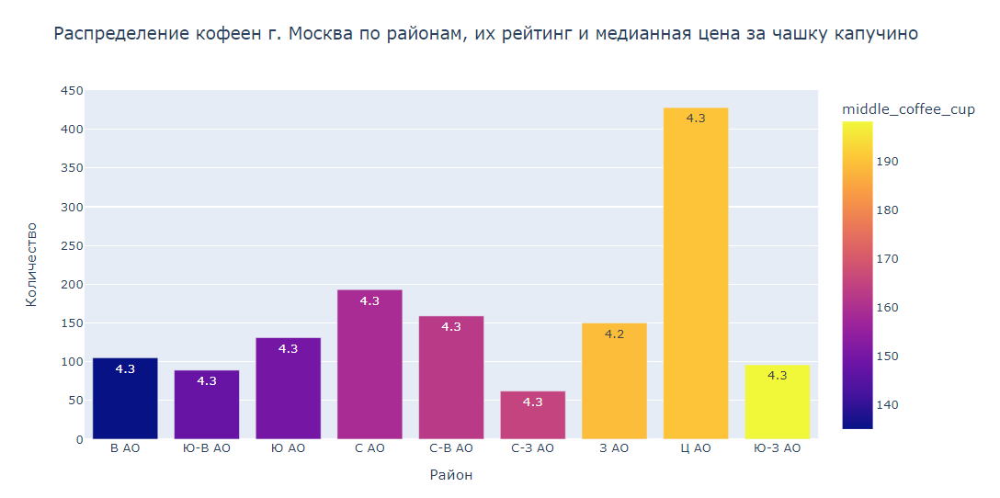

Больше всего кофеен в Центральном АО - 428. В других районах их количество не превышает 200. Что касается рейтинга, то медианный рейтинг по районам одинаковый - 4.3, только в Западном АО - 4.2. Медианная стоимость чашки капучино выше всего в Юго-западном, Центральном и Западном АО (190-200 руб.), ниже всего в Восточном, Юго-Восточном и Южном АО (135-150 руб.).

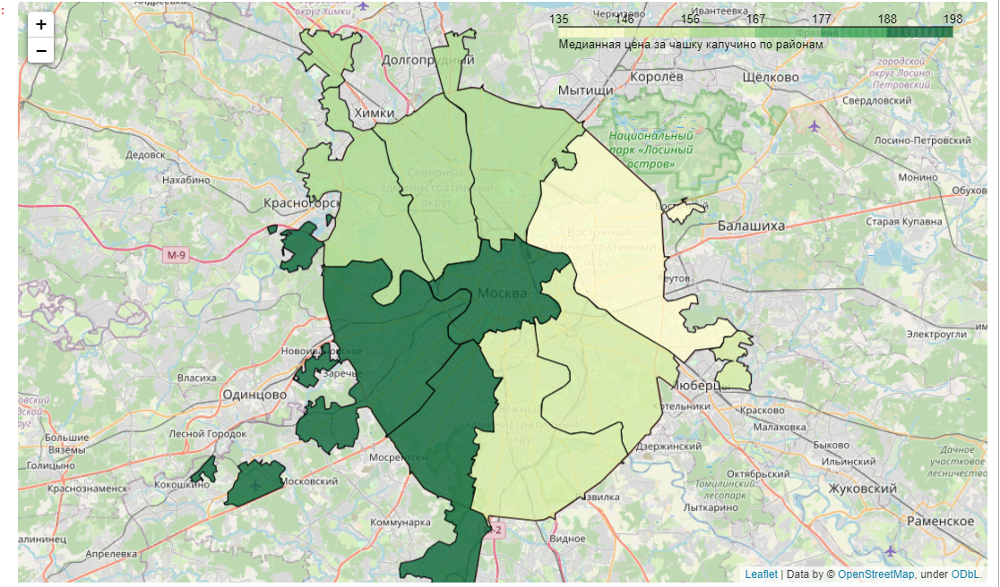

#### Топ-15 сетевых кофеен в г. Москва
<a id="coffe_house_chains">

Посмотрим на самые распространенные сети кофеен в г. Москва, цену за чашку капучино и их вместимость:

In [68]:
top_15_coffee_houses_chanes = df.query('category == "кофейня" and chain == 1')\
                    .groupby('name', as_index = False)\
                    .agg({'address' : 'count',
                          'middle_coffee_cup' : 'median',
                          'seats' : 'median'})\
                    .rename(columns = {'address' : 'count'})\
                    .sort_values('count', ascending = False)\
                    .head(15)
top_15_coffee_houses_chanes = top_15_coffee_houses_chanes.fillna('Нет данных')
top_15_coffee_houses_chanes

,name,count,middle_coffee_cup,seats
155,шоколадница,119,256.0,96.0
59,one price coffee,71,80.0,99.5
32,cofix,65,60.0,87.5
116,кофепорт,42,95.0,85.0
13,cofefest,31,95.0,60.0
115,кофемания,22,Нет данных,120.0
12,cinnabon,20,Нет данных,160.0
136,правда кофе,13,110.0,82.5
52,krispy kreme,9,225.0,99.0
27,coffeekaldi's,8,187.5,Нет данных


In [69]:
fig = px.bar(data_frame=top_15_coffee_houses_chanes.sort_values('count'), x='count', y='name', 
             text='middle_coffee_cup', 
             title = 'Самые распространенные сети кофеен в г. Москва и медианная цена за чашку капучино')

fig.update_layout( xaxis_title='Количество',
                   yaxis_title='')
fig.show()

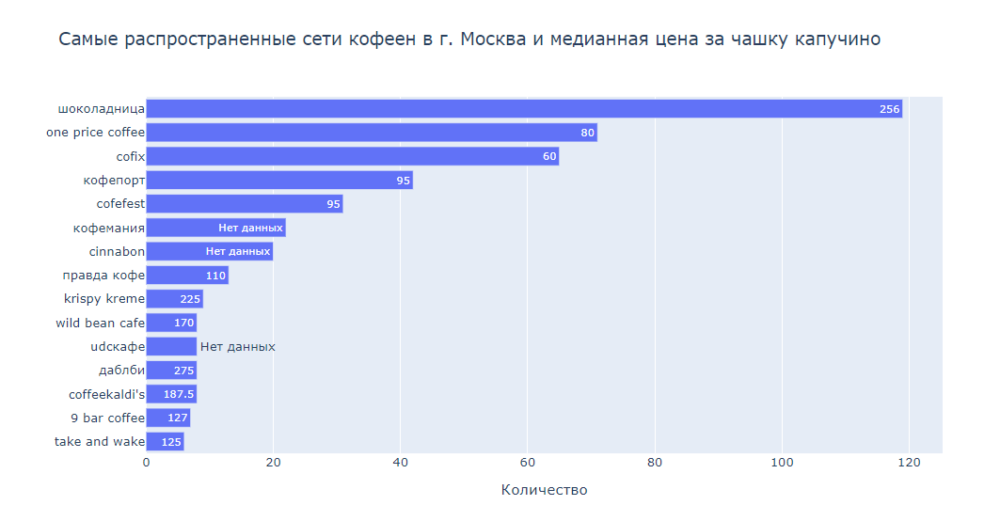

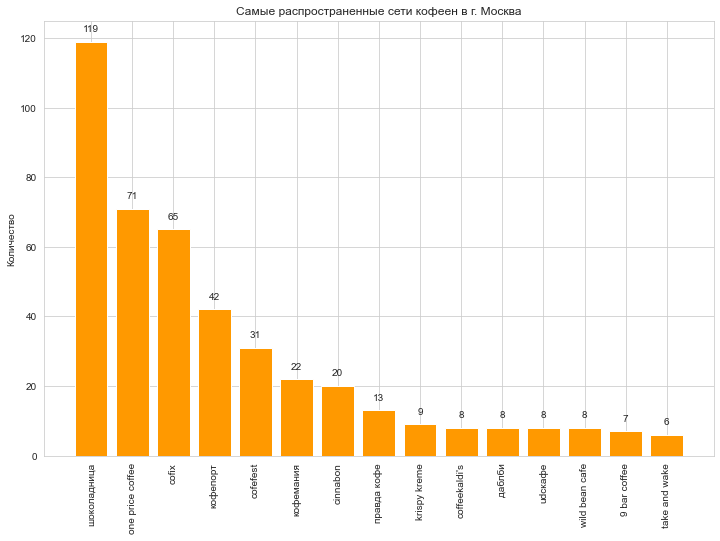

In [70]:
plt.figure(figsize=(12, 8))
plt.clf()

xs = top_15_coffee_houses_chanes['name']
ys = top_15_coffee_houses_chanes['count']

plt.bar(xs,ys)

for x,y in zip(xs,ys):

    label = "{:.0f}".format(y)

    plt.annotate(label, # this is the text
                 (x,y), # these are the coordinates to position the label
                 textcoords="offset points", # how to position the text
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center

plt.xlabel('')
plt.xticks(rotation =90)
plt.ylabel('Количество')
plt.title('Самые распространенные сети кофеен в г. Москва')   
    
plt.show()

Безусловным лидером по количеству точек в г. Москва (119) является сеть кофеен "Шоколадница", при этом медианная цена за чашку капучино в данной сети одна из самых высоких - 256 руб.  Второе и третье место по распространенности (65-70 заведений) занимают достаточно бюджетные кофейни "One price coffee" и "Cofix" с медианным чеком за капучино менее 100 руб. Самый высокий чек за капучино в сети кофеен "Даблби" - 275 руб., но их всего 8.

#### Круглосуточные кофейни
<a id="coffe_house_is_24_7">

Проверим, есть ли в представленном наборе данных круглосуточные кофейни:

In [71]:
coffee_houses_is_24_7 = coffee_houses_df[coffee_houses_df['is_24/7'] == True]

In [72]:
coffee_houses_is_24_7.shape[0] / coffee_houses_df.shape[0]

0.04175513092710545

Круглосуточных кофеен крайне мало -  менее 5%.

In [73]:
top_coffee_houses_is_24_7 = coffee_houses_is_24_7.groupby('name', as_index = False)\
                                                 .agg({'rating' : 'count'})\
                                                 .rename(columns = {'rating' : 'count'})\
                                                 .sort_values('count', ascending = False)\
                                                 .head(8)
top_coffee_houses_is_24_7

,name,count
21,шоколадница,17
16,кофемания,8
9,wild bean cafe,6
8,wild bean,5
14,кофе хауз,3
13,кофе с собой,2
10,you&coffee,2
1,cofix,2


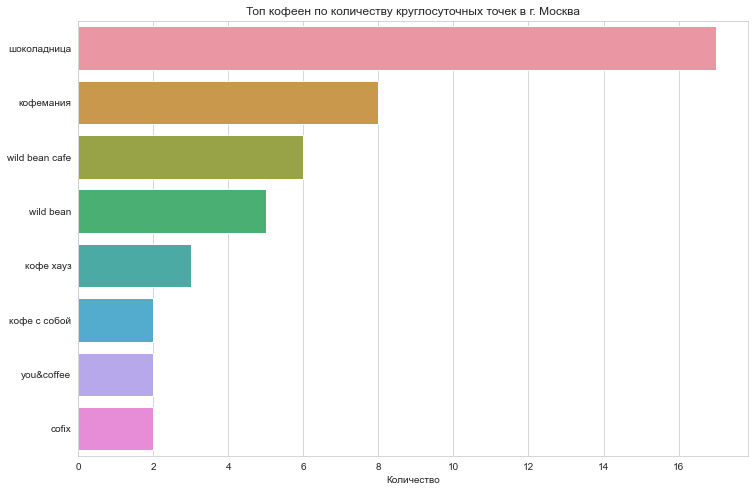

In [74]:
plt.figure(figsize=(12, 8))
sns.barplot(data = top_coffee_houses_is_24_7, x = 'count', y = 'name')
plt.xlabel('Количество')
plt.ylabel('')
plt.title('Топ кофеен по количеству круглосуточных точек в г. Москва')
plt.show()

Больше всего круглосуточных заведений у кофеен сети "Шоколадница". Далее идут "Кофемания" и "Wild bean cafe".

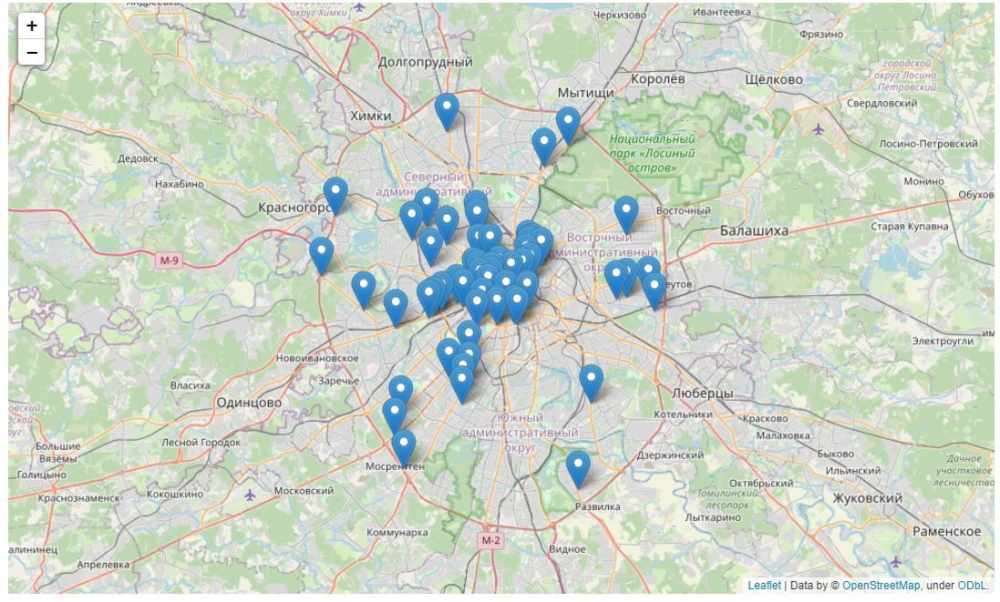

Круглосуточные кофейни расположены, в основном, в Центральном и Западном АО. Среди них присутствуют заведения из топ-15 сетей, такие как: "Шоколадница", "Cofix", "Кофемания" и другие.

#### Выводы по разделу:
<a id="conclusions_coffee_houses">

- В представленном датасете всего 1413 кофеен (16.8% от всех заведений).
- Больше всего кофеен в Центральном АО - 428. В других районах их количество не превышает 200. Что касается рейтинга, то медианный рейтинг по районам, в основном - 4.3, только в Западном АО - 4.2. Медианная стоимость чашки капучино выше всего в Юго-западном, Центральном и Западном АО (190-200 руб.), ниже всего в Восточном, Юго-Восточном и Южном АО (135-150 руб.).
- Безусловным лидером по количеству точек в г. Москва (119) являеется сеть кофеен "Шоколадница", при этом медианная цена за чашку капучино в данной сети одна из самых высоких - 256 руб. Второе и третье место по распространенности (65-70 заведений) занимают достаточно бюджетные кофейни "One price coffee" и "Cofix" с медианным чеком за капучино менее 100 руб. Самый высокий чек за капучино в сети кофеен "Даблби" - 275 руб., но их всего 8.
- Круглосуточных кофеен в представленном датасете - 59 (менее 5% от всех кофеен). Расположены они, в основном, в Центральном и Западном АО. Среди них присутствуют кофейни из топ-15 сетей, такие как: "Шоколадница", "One price coffee", "Cofix", "Кофемания" и другие.

### Шаг 5. Рекомендации по открытию кафе
<a id="recommendations_about_opening_coffee_house">

#### Расположение
<a id="recommendations_about_place">

Карта кофеен по кластерам построена для поиска потенциальных мест, где можно разместить кофейню (изображения представлены в презентации).

In [76]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_houses_df.apply(create_clusters, axis=1)

# выводим карту
m

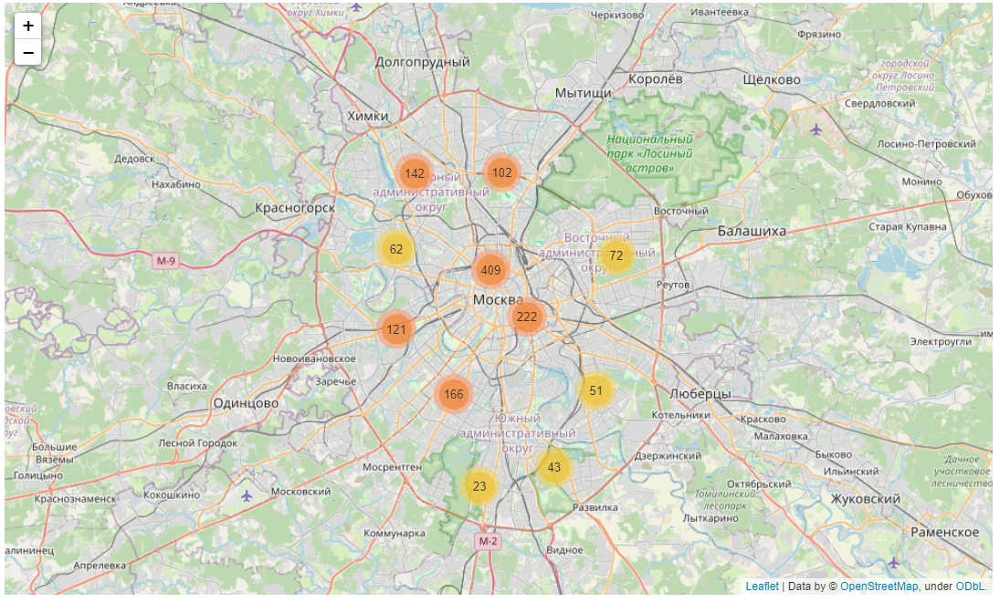

Новую кофейню рекомендуется расположить в самых проходимых и узнаваемых локациях г. Москва: парки, станции метро, туристические улицы. Примеры локаций показаны в презентации.

#### Ценовая политика
<a id="recommendations_about_price">

Для рекомендаций ценовой политики посмотрим на числовые характеристики столбца средней цены за чашку капучино по всем кофейням датасета:

In [77]:
coffee_houses_df['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

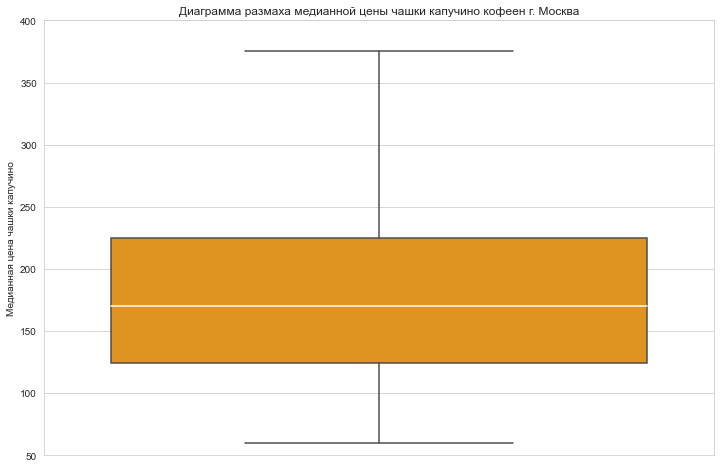

In [78]:
plt.figure(figsize=(12, 8))
sns.boxplot(y=coffee_houses_df['middle_coffee_cup'], medianprops={"color": "white"})
plt.ylim(50, 400)
plt.xlabel('')
plt.ylabel('Медианная цена чашки капучино')
plt.title('Диаграмма размаха медианной цены чашки капучино кофеен г. Москва')
plt.show()

Среди всего набора данных о кофейнях г. Москва медианная цена за капучино установилась на уровне 170 руб. Более половины всех наблюдений находятся в диапазоне 125-225 руб.

А также, с учетом рекомендуемого расположения в центре г. Москва, посмотрим на тот же столбец, но только для кофеен Центрального АО:

In [79]:
coffee_houses_df_central_district = coffee_houses_df.query('district == "Центральный административный округ"')

In [80]:
coffee_houses_df_central_district['middle_coffee_cup'].describe()

count    162.000000
mean     187.518519
std       67.263201
min       60.000000
25%      139.000000
50%      190.000000
75%      250.000000
max      328.000000
Name: middle_coffee_cup, dtype: float64

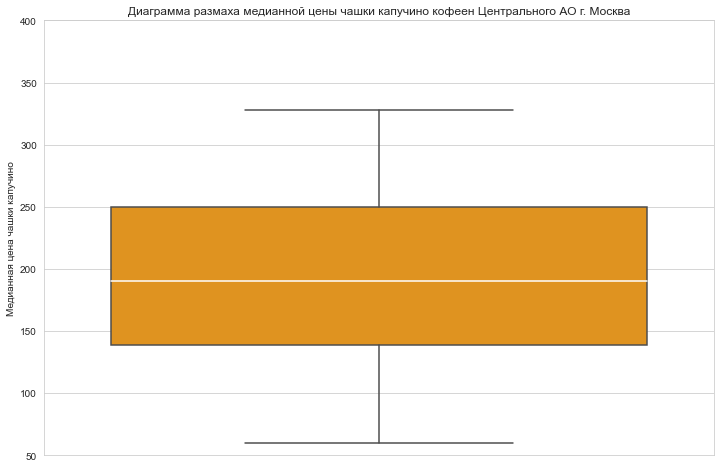

In [81]:
plt.figure(figsize=(12, 8))
sns.boxplot(y=coffee_houses_df_central_district['middle_coffee_cup'], medianprops={"color": "white"})
plt.ylim(50, 400)
plt.xlabel('')
plt.ylabel('Медианная цена чашки капучино')
plt.title('Диаграмма размаха медианной цены чашки капучино кофеен Центрального АО г. Москва')
plt.show()

Среди набора данных о кофейнях Центрального АО г. Москва медианная цена за капучино установилась на уровне 190 руб. Более половины всех наблюдений находятся в диапазоне 140-250 руб.

С учетом расположения кофейни в Центральном АО г. Москва рекомендуется установить медианную цену за чашку капучино на уровне 190-250 руб. Указанный ценовой диапазон выбран исходя из предположения, что кофейня будет рассчитана не менее, чем на 80 посадочных мест (медианный показатель в категории), и будет являться конкурентом для наиболее распространенных кофеен г. Москва (по формату и ассортименту меню).

### Выводы и результаты исследования
<a id="common_conclusion">

Данное исследование было проведено на основании данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

*Целью исследования* было: подготовить исследование рынка заведений общественного питания Москвы, выявить особенности и закономерности, дать рекомендации по открытию кофейни, подготовить презентацию по полученным результатам.

*Исходные данные:* Датасет 'moscow_places.csv'. В наборе данных представлены ключевые характеристики заведений общественного питания г. Москва. 

*Исходные характеристики данных:* 8406 строк, 14 столбцов.
Типы данных: int64 - целые числа, float64 - вещественные числа, object - строки и прочее.
В 6 столбцах имеются пропуски.

В датасете представлено 8406 заведений г. Москва. Каждое заведение имеет название, категорию, адрес, административный округ, географические координаты, рейтинг. Данные о ценовой категории и ценовой политике заведения имеются менее, чем у половины заведений из набора данных.

*В целях подготовки данных к анализу* были предприняты следующие шаги:

- пропуски оставлены без изменений;
- удалены дубликаты заведений по совпадению наименования, адреса и рейтинга;
- добавлен новый столбец с улицей заведения (или ее аналогом) на базе его адреса;
- добавлен новый столбец с обозначением, является ли заведение круглосуточным.

*Обновленный размер датасета:* 8403 строки, 16 столбцов. 
Типы данных: int64 - целые числа, float64 - вещественные числа, object - строки и прочее, bool - булевы значения.

В ходе *анализа данных* отмечены следующие особенности и закономерности:

- Топ-3 категории заведений общественного питания г. Москва: кафе, рестораны и кофейни.
- Топ-3 категории по количеству посадочных мест в заведении (80 и более): рестораны, бары/пабы, кофейни. В столовых, заведениях быстрого питания и кафе в среднем 60 - 75 мест. Меньше всего посадочных мест в пиццериях и булочных: 50- 55 мест.
- Несетевых заведений в Москве в 1,6 раза больше, чем сетевых. 
- Чаще всего сетевые заведения представлены кафе, ресторанами и кофейнями.
- Самое популярная сеть в г. Москва - "Шоколадница" (120 заведений). Далее по популрности расположились пиццерии домино'с пицца (76 заведений), Додо пицца (74 заведения), кофейня One price coffee	(71 заведение), Яндекс лавка (69 заведений) и кофейния Сofix (65 заведений). Самыми распространенными форматами в топ-15 сетей являются кафе, кофейни, рестораны и пиццерии.
- Больше всего заведений представлено в Центральном АО Москвы (более 2000 заведений - это в 2 раза больше, чем в любом другом АО Москвы). При этом лидируют в данном районе рестораны (в 3 раза больше заведений, чем в любом другом АО), кафе, кофейни (в 3 раза больше, чем в других АО) и бары/пабы (в 5 раз больше, чем в других АО). В остальных районах преобладают кафе, рестораны и кофейни.
- Медианный рейтинг заведений по категориям варьируется в малом диапазоне 4.2 - 4.4, это говорит, что различия рейтинга по категориям заведений не столь существенны. С небольшим преимуществом в рейтинге лидируют бары и пабы, небольшое отставание в рейтинге у заведений быстрого питания и кафе.
- Медианные рейтинги по районам/административным округам практически не отличаются друг от друга. В Центральном АО медианный рейтинг немного выше (4.4), чем в остальных районах. Немногим ниже рейтинги в Северо-Восточном и Юго-Восточном АО (4.2).
- Самой популярной улицей по количеству заведений в г. Москва является проспект Мира - 183 заведения. На этой улице особенно много кафе - 53, ресторанов - 45 и кофеен - 36. Также популярными по наличию заведений являются Профсоюзная улица - 122 заведения, проспект Вернадского - 108 заведений и Ленинский проспект - 107 заведений.
- Улиц, на которых расположено всего 1 заведение - 420.  Эти заведения представлены, в большинстве своем, кафе, ресторанами или кофейнями. Средний чек в таких заведениях варьируется в диапазоне 300-1300 руб. Самый высокий средний чек в ресторанах и барах/пабах. Самый высокий рейтинг у баров/пабов, булочных.
- Самый высокий медианный средний чек в Центральном и Западном АО - 1000 руб. Это подтверждает факт, что в центре, как правило, всегда расположены самые дорогие заведения. Далее идут Северо-Западный АО, Северный АО, Юго-Западный и Восточный АО с диапазоном медианного чека 575 - 700 руб. Дешевле всего медианный чек в Северо-Восточном, Южном и Юго-Восточном АО (450 - 500 руб.).
- Больше всего заведений с низким рейтингом (3.8) оказалось в категории кафе - более 700, средний чек у них также невысокий - 380 руб. Около 280 ресторанов тоже отметились невысоким рейтингом (3.9), средний чек в них 505 руб., что для данной категории заведений можно считать низким показателем. Далее по количеству идут точки быстрого питания и кофейни - около 220 заведений со средним чеком 300-325. Самый высокий медианный средний чек в категории баров/пабов - 750 руб., таких заведений 60, но медианный рейтинг у них всего 3.8.

В результате *исследования кофеен* г. Москва выявлены следующие моменты:

- В представленном датасете всего 1413 кофеен (16.8% от всех заведений).
- Больше всего кофеен в Центральном АО - 428. В других районах их количество не превышает 200. Что касается рейтинга, то медианный рейтинг по районам, в основном - 4.3, только в Западном АО - 4.2. Медианная стоимость чашки капучино выше всего в Юго-западном, Центральном и Западном АО (190-200 руб.), ниже всего в Восточном, Юго-Восточном и Южном АО (135-150 руб.).
- Безусловным лидером по количеству точек в г. Москва (119) является сеть кофеен "Шоколадница", при этом медианная цена за чашку капучино в данной сети одна из самых высоких - 256 руб. Второе и третье место по распространенности (65-70 заведений) занимают достаточно бюджетные кофейни "One price coffee" и "Cofix" с медианным чеком за капучино менее 100 руб. Самый высокий чек за капучино в сети кофеен "Даблби" - 275 руб., но их всего 8.
- Круглосуточных кофеен в представленном датасете - 59 (менее 5% от всех кофеен). Расположены они, в основном, в Центральном и Западном АО. Среди них присутствуют кофейни из топ-15 сетей, такие как: "Шоколадница", "One price coffee", "Cofix", "Кофемания" и другие.

*Рекомендации по открытию кофейни:*

- Новую кофейню рекомендуется расположить в самых проходимых и узнаваемых локациях г. Москва: парки, станции метро, туристические улицы (например, парк «Зарядье», парк Горького и Нескучный сад, ближайшие станции метро и их окрестности).
- Круглосуточный режим работы будет являться конкурентным преимуществом заведения, если оно будет расположено в самом сердце столицы.
- С учетом расположения кофейни в Центральном АО г. Москва рекомендуется установить медианную цену за чашку капучино на уровне 190-250 руб. Указанный ценовой диапазон выбран исходя из предположения, что кофейня будет рассчитана не менее, чем на 80 посадочных мест (медианный показатель в категории), и будет являться конкурентом для наиболее распространенных кофеен г. Москва (по формату и ассортименту меню).

*При сборе данных следует обратить внимание на:*
- наличие дубликатов заведений, у которых сопадает наименование, адрес и прочие характеристики, но могут отличаться георграфические координаты и другие показатели;
- неунифицированный формат записи адреса заведения;
- неунифицированный формат записи ценовых показателей заведения;
- отсутствие ценовых показателей более, чем в половине набора данных.

**Презентация: https://disk.yandex.ru/i/i1ggRVsE-0xGFg**